# Topic 1: Introduction to Self-Attention and Its Limitations

---

## 1. Introduction
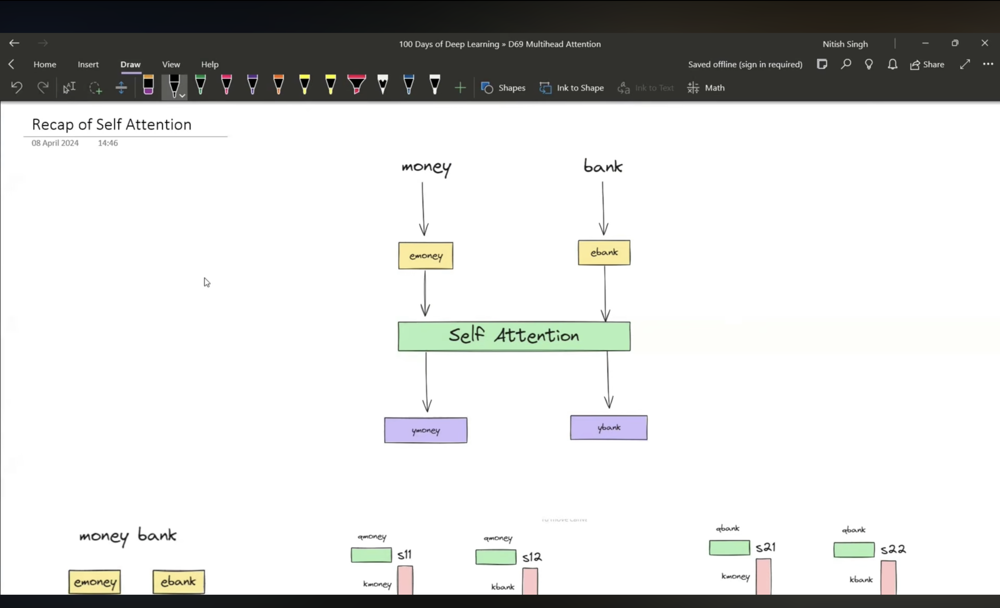
**What is Self-Attention?**

Self-attention is a technique used to generate **contextual embeddings** for words in a sentence.

**Why is this important?**

Traditional word embeddings (like Word2Vec or GloVe) are **static** – they give the same vector representation to a word regardless of its context. But words can have different meanings depending on where they appear. Self-attention solves this by creating embeddings that change based on surrounding words.

**Real-life use:**
- Machine Translation (Google Translate)
- Document Summarization
- Sentiment Analysis
- Chatbots and virtual assistants

---

## 2. Detailed Explanation

### The Problem with Static Embeddings

Imagine the word **"bank"**:

| Sentence | Meaning of "bank" |
|----------|-------------------|
| "I deposited money in the **bank**." | Financial institution |
| "We sat by the river **bank**." | Edge of a river |

With static embeddings, "bank" would have the **same** numerical representation in both sentences. Self-attention gives "bank" a **different embedding** depending on the context (money vs. river).

### How Self-Attention Works (High-Level)
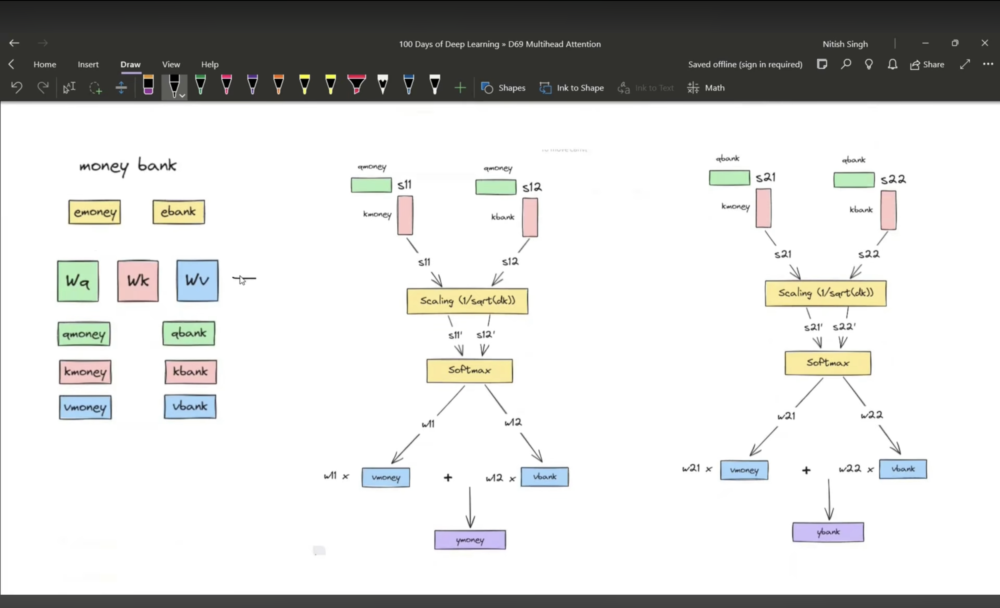
1. You have a sentence with words (e.g., "money bank")
2. Each word starts with a static embedding
3. For each word, you create **three vectors**:
   - **Query (Q)** – what this word is "looking for"
   - **Key (K)** – what this word "offers" to others
   - **Value (V)** – the actual content/meaning of the word
4. You compute **similarity scores** by taking dot products between every Query and every Key
5. You **scale** these scores (divide by a number to keep gradients stable)
6. You apply **softmax** to turn scores into probabilities (weights)
7. You multiply these weights by the Value vectors to get the final contextual embedding

> **Key insight:** Each word's final representation is a weighted combination of all other words' Values. The weights tell us how much attention each word should pay to every other word.

---

## 3. Key Points

- Self-attention generates **contextual** (not static) embeddings
- It uses **Query, Key, and Value** vectors derived from input embeddings
- Attention weights are computed using **dot products + scaling + softmax**
- Each word's output is a weighted sum of all Value vectors
- This allows the model to capture relationships between words

---

## 4. Common Mistakes

| Mistake | Explanation | How to Avoid |
|---------|-------------|--------------|
| Confusing embeddings with one-hot encoding | One-hot is sparse and doesn't capture meaning; embeddings are dense and capture semantics | Remember: embeddings = semantic meaning in vector form |
| Thinking self-attention gives a single fixed embedding | Self-attention gives **contextual** embeddings – they change per sentence | Practice with ambiguous words like "bank" or "bat" |
| Forgetting the scaling step | Without scaling, dot products can become very large, pushing softmax into extreme values | Always divide by √(dimension) – this keeps gradients healthy |

---

## 5. The Key Limitation of Self-Attention

### The Ambiguous Sentence Problem
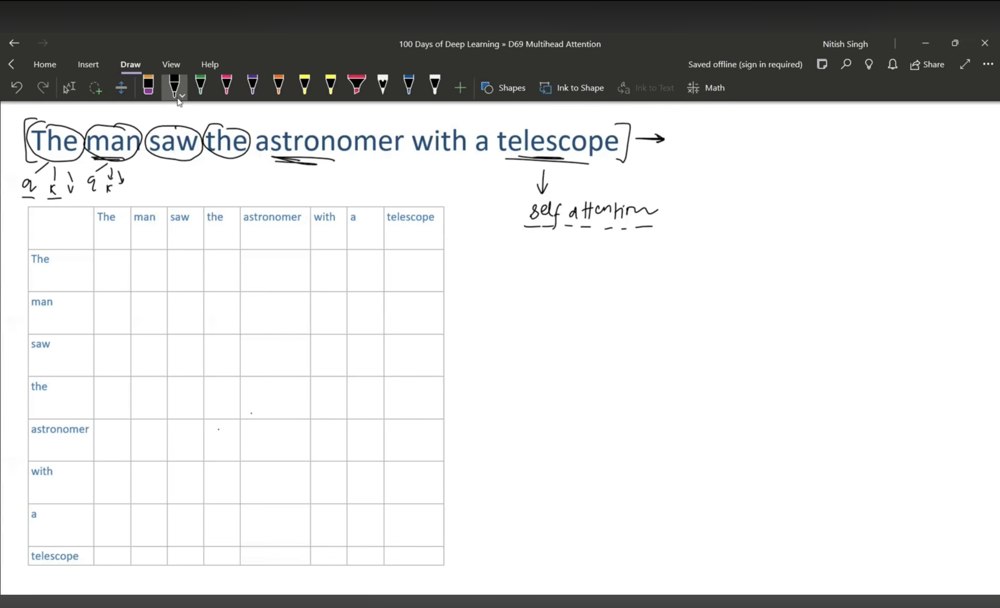
Consider the sentence:

> **"The man saw the astronomer with a telescope."**

This sentence has **two possible meanings**:

| Meaning | Interpretation |
|---------|----------------|
| **Meaning 1** | The man used a telescope to see the astronomer |
| **Meaning 2** | The man saw an astronomer who was holding a telescope |

**The Problem:**  
Self-attention can only capture **one** of these perspectives. It will assign high similarity between either:
- "man" ↔ "telescope" (Meaning 1), OR
- "astronomer" ↔ "telescope" (Meaning 2)

But it cannot capture **both** simultaneously. In real-world NLP tasks (like summarization, translation, or question answering), you often need to understand a text from **multiple perspectives**.

---

## 6. Revision Notes

- **Static embeddings** = one fixed vector per word
- **Contextual embeddings** = vector changes based on surrounding words
- **Self-attention** creates contextual embeddings using Q, K, V
- Self-attention uses dot products to measure similarity between words
- **Limitation**: Can only capture a single "perspective" or interpretation of a sentence
- This limitation is addressed by **Multi-Head Attention**

---



## Topic 2: Multi-Head Attention – Concept and Architecture

### 1. Introduction

**What it is:**  
Multi-Head Attention is an extension of self-attention where we use **multiple parallel self-attention modules** (called "heads") instead of just one. Each head processes the same input independently and learns different relationship patterns.

**Why it’s important:**  
It solves the single-perspective limitation of self-attention. By using multiple heads, the model can capture **multiple meanings, relationships, or viewpoints** from the same sentence simultaneously.

**Real-life use:**  
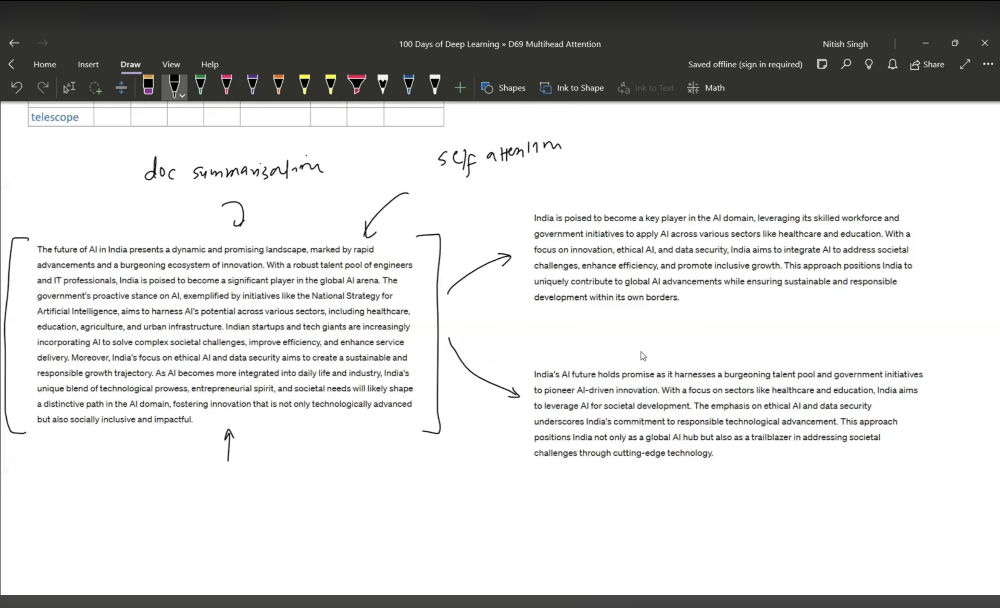
- Document summarization – generating summaries from different angles  
- Machine translation – capturing different grammatical and semantic relationships  
- Question answering – understanding questions in multiple ways  
- All modern Transformer models (BERT, GPT, etc.) use multi-head attention

---

### 2. Detailed Explanation

#### The Core Idea
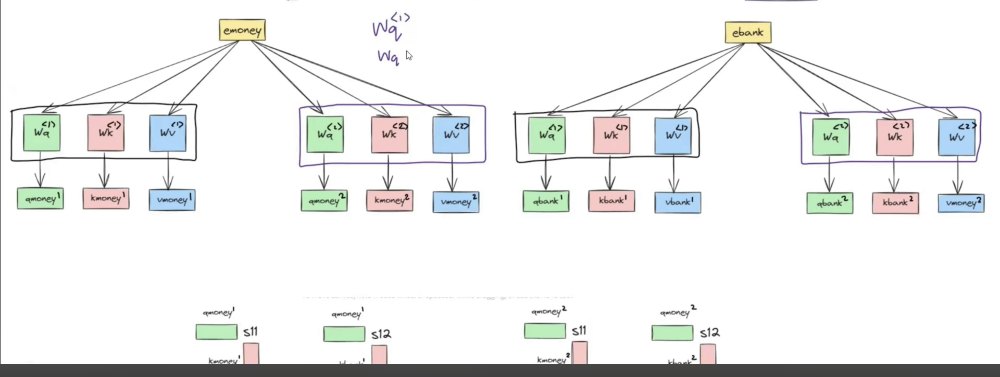
Instead of using **one** set of weight matrices (WQ, WK, WV), we use **multiple sets**.  
Each set defines one "head" – one independent self-attention module.

- If we use 2 heads → 2 sets of WQ, WK, WV  
- If we use 8 heads (as in the original Transformer paper) → 8 sets

Each head:
1. Takes the **same input embeddings**
2. Projects them with its **own** weight matrices to get its own Q, K, V
3. Runs the full self-attention process independently
4. Produces its own contextual embedding for each word

#### How Multiple Heads Capture Different Perspectives
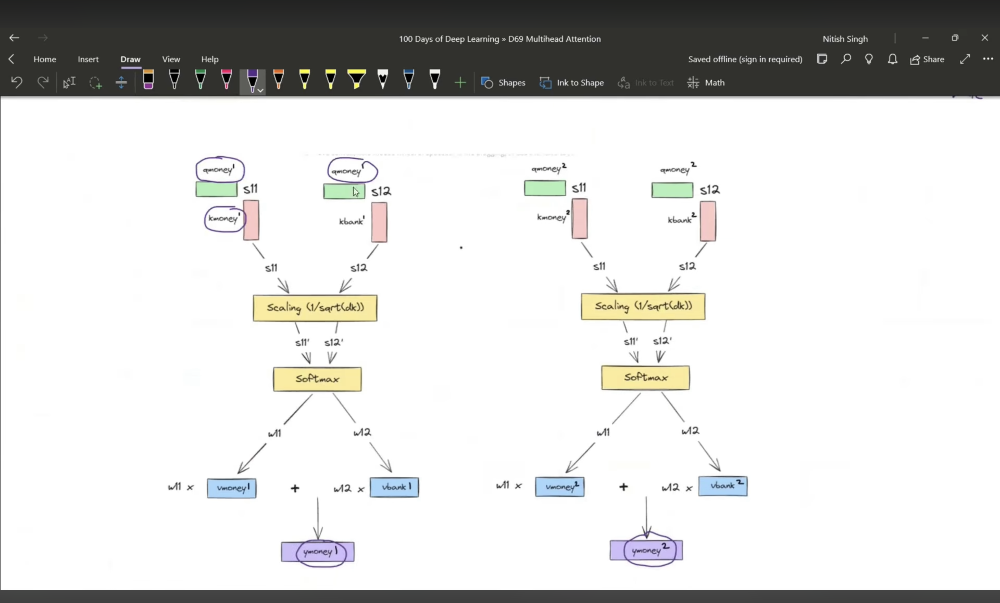
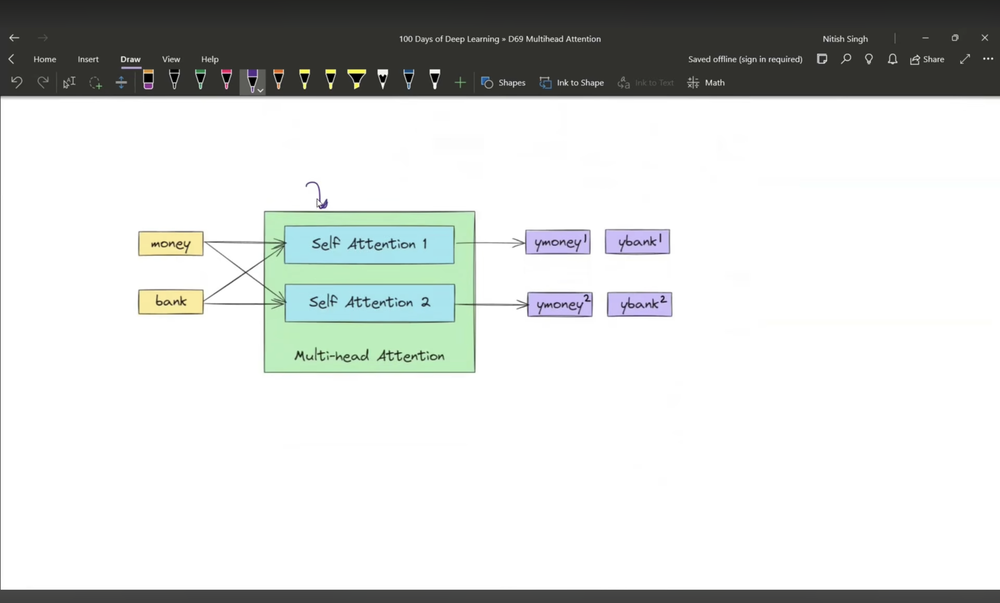
Using the ambiguous sentence:  
> *"The man saw the astronomer with a telescope."*

- **Head 1** might learn that "man" is strongly related to "telescope" → captures meaning 1 (man using telescope)
- **Head 2** might learn that "astronomer" is strongly related to "telescope" → captures meaning 2 (astronomer has telescope)

Each head focuses on different relationships because:
- They start with **different random weights**
- During training, they learn to specialize in different patterns
- The model doesn't force them to be different – it naturally happens due to random initialization and training dynamics

#### Visual Analogy

Think of it like having multiple experts analyzing the same document:
- Expert 1 focuses on grammar
- Expert 2 focuses on sentiment
- Expert 3 focuses on named entities
- Then you combine all their insights for a complete understanding

---

### 3. Key Points

- Multi-Head Attention = **multiple self-attention modules running in parallel**
- Each head has its **own** WQ, WK, WV weight matrices
- All heads receive the **same input** but process it independently
- Each head produces a **different contextual representation** for each word
- The number of heads is a hyperparameter (8 in the original Transformer)
- More heads = ability to capture more perspectives
- All heads operate **in parallel** – no sequential dependency

---

### 4. Common Mistakes

| Mistake | How to Avoid |
|---------|---------------|
| Thinking heads process different parts of the sentence | No – every head processes the **entire sentence** independently. |
| Believing heads are manually assigned to specific meanings | Heads **learn** to capture different patterns during training – we don't pre-define their roles. |
| Confusing "heads" with "layers" | Heads are **parallel** within one layer; layers are **sequential** (one after another). |
| Assuming more heads always = better | More heads increase computation; there's a trade-off. |

---

### 5. Revision Notes (Quick Recap)

- Self-attention limitation: **one perspective only**
- Solution: Use **multiple self-attention modules** = Multi-Head Attention
- Each module = one **head**
- Each head has its own **WQ, WK, WV** matrices
- All heads run **in parallel** on the same input
- Each head outputs its own contextual embeddings
- Different heads capture **different relationships/perspectives**
- Original Transformer uses **8 heads**

---

### 6. Connection to What's Next

We've now understood the **concept** – multiple heads running in parallel. But how do we actually combine their outputs? How do we go from multiple representations back to a single output of the right size?  

That involves:
- Concatenation of head outputs
- A final linear projection (W_O) to blend perspectives and restore dimensions

This will be covered in the next topic.

---

**End of Topic 2.**



## Topic 3: Multi-Head Attention – Matrix Form and Step-by-Step Walkthrough

### 1. Introduction

**What it is:**  
This topic walks through the complete matrix operations of multi-head attention using a concrete example. Understanding the matrix form is essential because real implementations (like PyTorch or TensorFlow) perform these operations in batch matrix form for efficiency.

**Why it’s important:**  
The conceptual idea of "multiple heads" is simple, but the actual implementation involves careful handling of dimensions, concatenation, and linear projections. This step-by-step breakdown bridges the gap between theory and practice.

**Real-life use:**  
Every Transformer-based model (BERT, GPT, T5, etc.) implements multi-head attention exactly this way. Understanding this matrix form helps you debug, optimize, or customize these models.

---

### 2. Detailed Explanation – Step by Step with Example
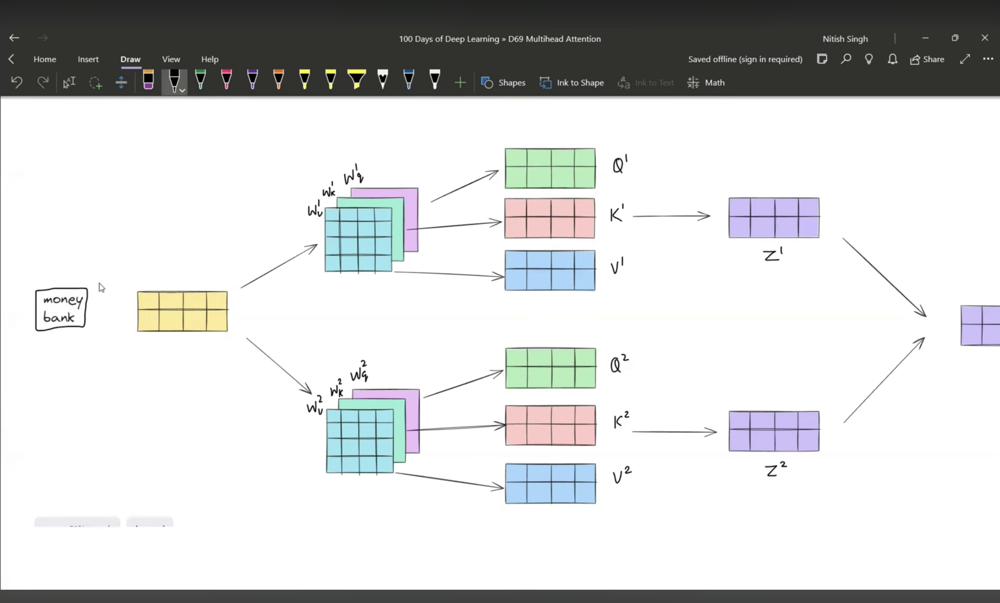
We'll use a simple sentence with **two words**: *"money bank"*.

**Assumptions for this example:**
- Embedding dimension = **4** (each word is a 4D vector)
- Number of heads = **2**
- This gives us a 2×4 input matrix (2 words, 4 dimensions each)

---

#### Step 1: Input Embeddings

Let our input matrix be **X** of shape **(2 × 4)**:
- Row 1 = embedding of "money" (4 numbers)
- Row 2 = embedding of "bank" (4 numbers)

```
X = [ e_money ]   → shape: 2 rows × 4 columns
    [ e_bank  ]
```

---

#### Step 2: Linear Projection – Create Q, K, V for Each Head

Since we have **2 heads**, we need **2 sets** of weight matrices:

**Head 1 (first set):**
- WQ₁: 4×4
- WK₁: 4×4
- WV₁: 4×4

**Head 2 (second set):**
- WQ₂: 4×4
- WK₂: 4×4
- WV₂: 4×4

> Note: In the original Transformer paper, these matrices are **512×64**, but we use 4×4 here for simplicity.

**Compute Q, K, V for Head 1:**
```
Q₁ = X · WQ₁   → shape: (2×4) · (4×4) = 2×4
K₁ = X · WK₁   → shape: 2×4
V₁ = X · WV₁   → shape: 2×4
```
Each row of Q₁ corresponds to a word:  
- Row 1 = q_money₁  
- Row 2 = q_bank₁  

Similarly for K₁ and V₁.

**Compute Q, K, V for Head 2 (with the second set of weights):**
```
Q₂ = X · WQ₂   → shape: 2×4
K₂ = X · WK₂   → shape: 2×4
V₂ = X · WV₂   → shape: 2×4
```

Now we have **two complete sets** of Q, K, V – one per head.

---

#### Step 3: Apply Self-Attention in Each Head

For **Head 1**:
1. Compute attention scores: `Scores₁ = Q₁ · K₁ᵀ` → shape: (2×4) · (4×2) = **2×2**  
   - Element (i, j) = similarity between word i and word j
2. Scale: divide by √(dimension) = √4 = 2
3. Apply softmax row-wise → attention weights (2×2)
4. Compute output: `Z₁ = Weights₁ · V₁` → shape: (2×2) · (2×4) = **2×4**  
   - Row 1 = contextual embedding of "money" from head 1  
   - Row 2 = contextual embedding of "bank" from head 1

**For Head 2** (exactly the same process, with Q₂, K₂, V₂):
- `Z₂ = Attention(Q₂, K₂, V₂)` → shape: **2×4**  
   - Row 1 = contextual embedding of "money" from head 2  
   - Row 2 = contextual embedding of "bank" from head 2

---

#### Step 4: Concatenate the Head Outputs
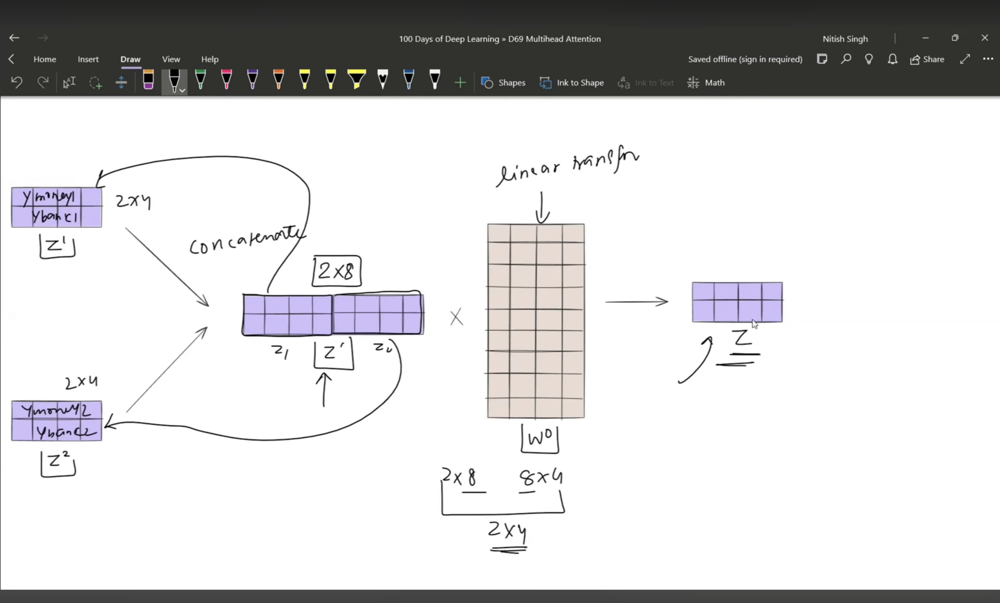
Now we have:
- Z₁ → 2×4 (head 1 output)
- Z₂ → 2×4 (head 2 output)

We **concatenate** them along the column (feature) dimension:
```
Z_concat = [ Z₁ | Z₂ ]   → shape: 2 × (4+4) = 2×8
```
- Row 1 = [context from head 1 for "money"  |  context from head 2 for "money"]
- Row 2 = [context from head 1 for "bank"   |  context from head 2 for "bank"]

---

#### Step 5: Final Linear Projection (W_O)

**Problem:** Our input X was 2×4, but after concatenation we have 2×8. We need to bring it back to **2×4** so the output dimension matches the input.

**Solution:** Multiply by a weight matrix **W_O** of shape **(8×4)**:
```
Final_Output = Z_concat · W_O   → shape: (2×8) · (8×4) = 2×4
```

**Purpose of W_O:**
- It's a **learnable** matrix
- It blends information from all heads
- It decides how much weight to give to each perspective
- It restores the original dimension

Now the output has the same shape as the input: 2×4.

---

### 3. Key Points

| Step | Operation | Shape Change | Purpose |
|------|-----------|--------------|---------|
| 1 | Input X | 2×4 | Raw embeddings |
| 2 | Linear projections | 2×4 (per head) | Create Q, K, V per head |
| 3 | Self-attention per head | 2×4 (per head) | Generate contextual embeddings per head |
| 4 | Concatenation | 2×8 | Combine all perspectives |
| 5 | Final projection (W_O) | 2×4 | Blend perspectives, restore dimension |

---

### 4. Syntax/Structure (Matrix Form Summary)

```
Given:
- X: input embeddings (n_words × d_model)
- h: number of heads
- d_k: dimension per head (usually d_model / h)

For each head i (1 to h):
    Q_i = X · WQ_i    (WQ_i: d_model × d_k)
    K_i = X · WK_i    (WK_i: d_model × d_k)
    V_i = X · WV_i    (WV_i: d_model × d_k)
    Z_i = Attention(Q_i, K_i, V_i)   (Z_i: n_words × d_k)

Concatenate:
    Z_concat = [Z₁; Z₂; ...; Z_h]   (n_words × d_model)

Final projection:
    Output = Z_concat · W_O         (W_O: d_model × d_model)
    Output shape: n_words × d_model (same as input)
```

---

### 5. Common Mistakes

| Mistake | How to Avoid |
|---------|---------------|
| Forgetting that Q, K, V dimensions per head are **smaller** than the model dimension | In practice, d_k = d_model / h. Each head works in a lower-dimensional space. |
| Thinking concatenation happens along rows (words) | No – concatenate along **columns** (features), so the number of rows (words) stays the same. |
| Skipping the final W_O projection | Without it, the output dimension would be h × d_k, which is larger than input. The W_O projection is essential. |
| Mixing up W_O with the other weight matrices | WQ, WK, WV are per-head; W_O is **single** and applied after concatenation. |

---

### 6. Revision Notes (Quick Recap)

- **Input:** X (n_words × d_model)
- **For each head i:**  
  - Qᵢ = X·WQᵢ, Kᵢ = X·WKᵢ, Vᵢ = X·WVᵢ  
  - Zᵢ = SelfAttention(Qᵢ, Kᵢ, Vᵢ)  
- **Concatenate** all Zᵢ → shape: n_words × (h × d_k) = n_words × d_model  
- **Final projection:** Multiply by W_O → shape back to n_words × d_model  
- W_O is **learnable** and blends perspectives from all heads  
- This entire process ensures output dimension **matches** input dimension

---

**End of Topic 3.**



## Topic 4: Original Transformer Implementation – 8 Heads, Dimension Reduction, and Computation Efficiency
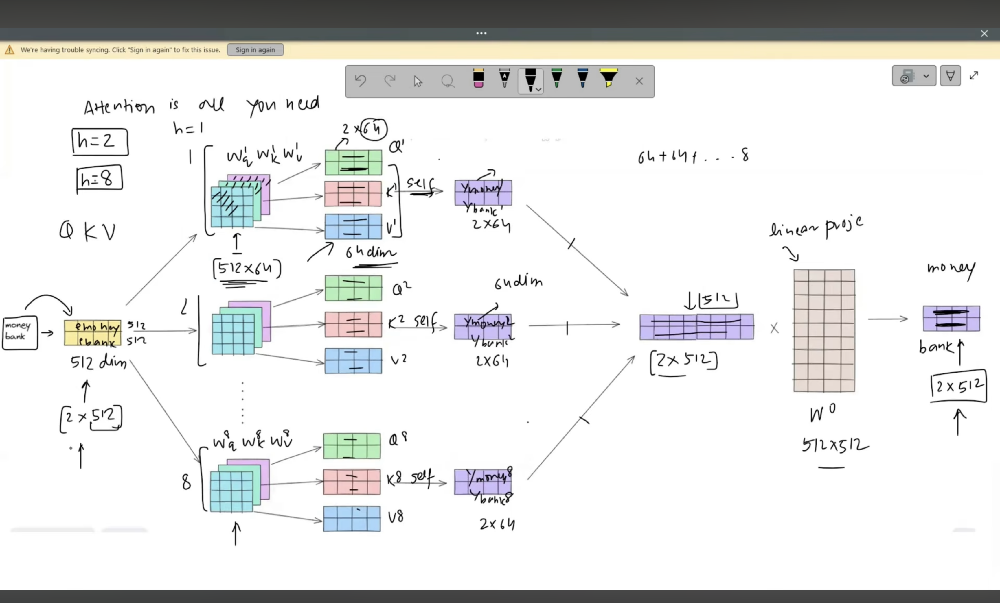
### 1. Introduction

**What it is:**  
This topic covers how multi-head attention was **actually implemented** in the original Transformer paper ("Attention Is All You Need"). While our previous example used 2 heads and 4-dimensional embeddings, the original paper used **8 heads** and **512-dimensional embeddings**. This topic explains the specific design choices and the reasoning behind them.

**Why it’s important:**  
Understanding the original implementation helps you:
- Read and understand research papers
- Implement Transformers correctly in code
- Appreciate the efficiency trade-offs
- Know the standard hyperparameters used in practice

**Real-life use:**  
Most production Transformers (BERT-base, GPT-2, etc.) follow this exact architecture with 8–16 heads and 512–768 dimensions. This is the industry standard.

---

### 2. Detailed Explanation

#### Key Differences from Our Previous Example

| Aspect | Our Example | Original Transformer |
|--------|-------------|---------------------|
| Embedding dimension (d_model) | 4 | **512** |
| Number of heads (h) | 2 | **8** |
| Dimension per head (d_k) | 4 | **64** |
| Total dimensions after concatenation | 4 (2×4) | **512 (8×64)** |
| Shape of WQ, WK, WV | 4×4 | **512×64** |
| Shape of W_O | 8×4 | **512×512** |

Notice: **d_k = d_model / h** = 512 / 8 = 64. This is not a coincidence – it's a deliberate design choice.

---

#### Why Reduce Dimension Per Head? (512 → 64)

The transcript explicitly asks and answers: *"Why did we go from 512 to 64 here?"*

**Simple answer:** To **reduce computations**.

Let's understand this with numbers:

**If we used full 512 dimensions per head (no reduction):**
- Each head would compute attention on 512-dimensional Q, K, V
- 8 heads → 8 × (512 × 512) operations per head
- Total computation would be **8 times** larger than single-head attention

**With dimension reduction to 64 per head:**
- Each head computes attention on only 64-dimensional Q, K, V
- 8 heads → 8 × (512 × 64) operations per head
- Total computation ≈ **same** as single-head attention with 512 dimensions

**The math:**
- Single-head with 512 dims: 512² = 262,144 operations
- 8 heads with 64 dims each: 8 × (512 × 64) = 8 × 32,768 = 262,144 operations

> **Key insight:** By splitting 512 dimensions into 8 groups of 64, we keep the **same total computation** but gain the ability to capture **8 different perspectives**. This is the "best of both worlds" – efficiency + multiple perspectives.

---

#### Complete Architecture of Original Transformer Multi-Head Attention

**Step 1: Input**
- Sentence of length n (e.g., n=2 for "money bank")
- Each word has a 512-dimensional embedding
- Input matrix X: **n × 512**

**Step 2: Linear Projections (for each of the 8 heads)**

For head 1 to 8:
- WQᵢ: 512 × 64
- WKᵢ: 512 × 64
- WVᵢ: 512 × 64

Compute:
- Qᵢ = X · WQᵢ → shape: n × 64
- Kᵢ = X · WKᵢ → shape: n × 64
- Vᵢ = X · WVᵢ → shape: n × 64

**Step 3: Self-Attention (in parallel for all heads)**

For each head i:
- Zᵢ = Attention(Qᵢ, Kᵢ, Vᵢ) → shape: n × 64

**Step 4: Concatenate all head outputs**
- Z_concat = [Z₁; Z₂; ...; Z₈] → shape: n × (8 × 64) = **n × 512**

**Step 5: Final linear projection**
- Multiply by W_O (512 × 512)
- Output = Z_concat · W_O → shape: n × 512

**Final result:** Output dimension = Input dimension (n × 512)

---

#### Visual Summary of Dimensions

```
Input X:                    n × 512
                            ↓
        ┌───────────────────┼───────────────────┐
        ↓                   ↓                   ↓
    Head 1              Head 2  ...         Head 8
   Q₁: n×64            Q₂: n×64            Q₈: n×64
   K₁: n×64            K₂: n×64            K₈: n×64
   V₁: n×64            V₂: n×64            V₈: n×64
        ↓                   ↓                   ↓
    Z₁: n×64            Z₂: n×64            Z₈: n×64
        └───────────────────┼───────────────────┘
                            ↓
            Concatenate: n × 512
                            ↓
              W_O (512×512) ↓
                            ↓
              Output: n × 512
```

---

### 3. Key Points

- **d_model = 512** (embedding dimension in original paper)
- **h = 8** (number of attention heads)
- **d_k = d_model / h = 64** (dimension per head)
- Weight matrices per head: **512 × 64** (not 512 × 512)
- Weight matrices are **different** for each head (randomly initialized, learned separately)
- Total computation ≈ same as single-head attention with 512 dimensions
- W_O (512 × 512) is a **single** matrix applied after concatenation
- The output dimension always equals the input dimension (n × 512)

---

### 4. Common Mistakes

| Mistake | How to Avoid |
|---------|---------------|
| Thinking each head uses the full 512 dimensions | No – each head uses **64 dimensions**. The 512 is split across heads. |
| Believing d_k can be any number | In practice, d_k = d_model / h. This keeps total computation constant. |
| Confusing W_O with per-head weights | WQ, WK, WV are **per head** (8 sets). W_O is **single** and applied once. |
| Thinking more heads always means more computation | With dimension reduction, total computation stays the same. More heads = more perspectives, not more FLOPs. |

---

### 5. Interview/Exam Questions

**Q1: Why does the original Transformer use 8 heads instead of 1?**  
**A:** To capture multiple perspectives/relationships from the same sentence. Each head can focus on different patterns (e.g., syntactic vs. semantic relationships).

**Q2: Why is the dimension per head (d_k) set to d_model / h?**  
**A:** To keep the total computational cost approximately the same as single-head attention while gaining the benefit of multiple perspectives.

**Q3: What would happen if we used 8 heads but kept d_k = 512?**  
**A:** The computation would increase 8×, and the concatenated output would be n × 4096, requiring a much larger W_O (4096 × 512). This would be computationally very expensive.

**Q4: Is W_O shared across heads?**  
**A:** No. W_O is a **single** matrix applied after concatenation. It is not per-head. Each head has its own WQ, WK, WV, but they all share the same W_O.

---

### 6. Revision Notes (Quick Recap)

- Original Transformer: **d_model = 512**, **h = 8**, **d_k = 64**
- Dimension reduction → keeps computation **constant** vs. single-head
- Each head: Q, K, V are **n × 64**
- Concatenation: **n × 512** (restores full dimension)
- Final W_O: blends perspectives and maps back to n × 512
- Total parameters: 8 × (3 × 512 × 64) + (512 × 512) ≈ 1.05 million for attention
- This design gives **8 perspectives** at the **same cost** as 1 perspective

---

**End of Topic 4.**

